<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Comparison-of-two-power-plants" data-toc-modified-id="Comparison-of-two-power-plants-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Comparison of two power plants</a></span><ul class="toc-item"><li><span><a href="#Plant-1-data-vs-Plant2-data" data-toc-modified-id="Plant-1-data-vs-Plant2-data-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Plant 1 data vs Plant2 data</a></span></li></ul></li><li><span><a href="#Plant-I-weather-sensor-vs-Plant-II-weather-sensor" data-toc-modified-id="Plant-I-weather-sensor-vs-Plant-II-weather-sensor-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Plant I weather sensor vs Plant II weather sensor</a></span></li></ul></div>

## Comparison of two power plants

### Plant 1 data vs Plant2 data

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#we take file for plant 1 Generation data
file = 'Plant_1_Generation_Data.csv'

In [3]:
plant1_data = pd.read_csv(file) # load data

<div class="alert alert-success" role="alert">


**Cleaning data**

I convert DATE_TIME object type to datetime type. After I separate DATE_TIME to **date** and **time**

In [4]:
#we compute a sum of 22 inverters
plant1_data = plant1_data.groupby('DATE_TIME')[['DC_POWER','AC_POWER', 'DAILY_YIELD','TOTAL_YIELD']].agg('sum')

In [5]:
plant1_data = plant1_data.reset_index()

In [6]:
plant1_data['DATE_TIME'] = pd.to_datetime(plant1_data['DATE_TIME'] ,format='%d-%m-%Y %H:%M'  )

In [7]:
plant1_data['time'] = plant1_data['DATE_TIME'].dt.time

plant1_data['date'] = pd.to_datetime(plant1_data['DATE_TIME'].dt.date)

In [8]:
file2 = 'Plant_2_Generation_Data.csv'

In [9]:
plant1_data

,DATE_TIME,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,time,date
0,2020-06-01 00:00:00,0.0,0.0,5407.250000,153519480.0,00:00:00,2020-06-01
1,2020-06-01 00:15:00,0.0,0.0,0.000000,153519480.0,00:15:00,2020-06-01
2,2020-06-01 00:30:00,0.0,0.0,0.000000,153519480.0,00:30:00,2020-06-01
3,2020-06-01 00:45:00,0.0,0.0,0.000000,153519480.0,00:45:00,2020-06-01
4,2020-06-01 01:00:00,0.0,0.0,0.000000,153519480.0,01:00:00,2020-06-01
...,...,...,...,...,...,...,...
3153,2020-05-31 22:45:00,0.0,0.0,125291.000000,153519480.0,22:45:00,2020-05-31
3154,2020-05-31 23:00:00,0.0,0.0,125291.000000,153519480.0,23:00:00,2020-05-31
3155,2020-05-31 23:15:00,0.0,0.0,125291.000000,153519480.0,23:15:00,2020-05-31
3156,2020-05-31 23:30:00,0.0,0.0,125291.000000,153519480.0,23:30:00,2020-05-31


In [10]:
plant2_data = pd.read_csv(file2)

In [11]:
plant2_data.head(3)

,DATE_TIME,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,2020-05-15 00:00:00,4136001,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06
1,2020-05-15 00:00:00,4136001,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09
2,2020-05-15 00:00:00,4136001,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09


In [12]:
plant2_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67698 entries, 0 to 67697
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATE_TIME    67698 non-null  object 
 1   PLANT_ID     67698 non-null  int64  
 2   SOURCE_KEY   67698 non-null  object 
 3   DC_POWER     67698 non-null  float64
 4   AC_POWER     67698 non-null  float64
 5   DAILY_YIELD  67698 non-null  float64
 6   TOTAL_YIELD  67698 non-null  float64
dtypes: float64(4), int64(1), object(2)
memory usage: 3.6+ MB


In [13]:
#we compute a sum of 22 inverters
plant2_data = plant2_data.groupby('DATE_TIME')[['DC_POWER','AC_POWER', 'DAILY_YIELD','TOTAL_YIELD']].agg('sum').reset_index()

In [14]:
plant2_data['DATE_TIME'] = pd.to_datetime(plant2_data['DATE_TIME'], errors='coerce')
plant2_data['time'] = plant2_data['DATE_TIME'].dt.time
plant2_data['date'] = pd.to_datetime(plant2_data['DATE_TIME'].dt.date)

In [15]:
plant2_data.tail(3)

,DATE_TIME,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,time,date
3256,2020-06-17 23:15:00,0.0,0.0,93040.0,1.419408e+10,23:15:00,2020-06-17
3257,2020-06-17 23:30:00,0.0,0.0,93040.0,1.419408e+10,23:30:00,2020-06-17
3258,2020-06-17 23:45:00,0.0,0.0,93040.0,1.419408e+10,23:45:00,2020-06-17


In [16]:
plant2_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3259 entries, 0 to 3258
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   DATE_TIME    3259 non-null   datetime64[ns]
 1   DC_POWER     3259 non-null   float64       
 2   AC_POWER     3259 non-null   float64       
 3   DAILY_YIELD  3259 non-null   float64       
 4   TOTAL_YIELD  3259 non-null   float64       
 5   time         3259 non-null   object        
 6   date         3259 non-null   datetime64[ns]
dtypes: datetime64[ns](2), float64(4), object(1)
memory usage: 178.4+ KB


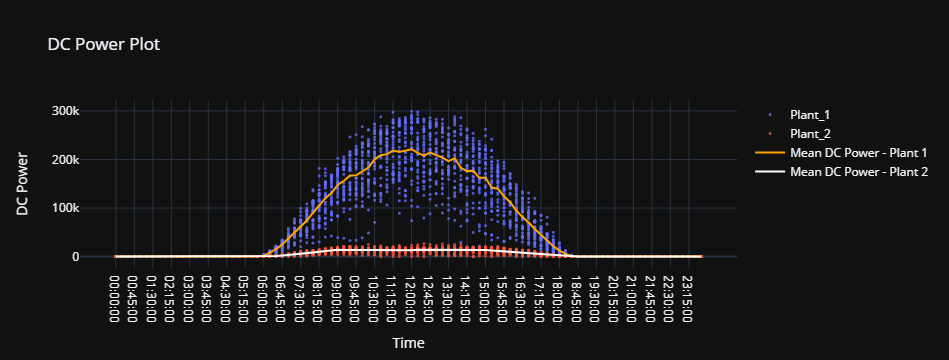

In [17]:
dc_mean_p1 = plant1_data.groupby('time')['DC_POWER'].agg('mean').reset_index()
dc_mean_p2 = plant2_data.groupby('time')['DC_POWER'].agg('mean').reset_index()

fig = go.Figure()

fig.add_trace(go.Scatter(x=plant1_data["time"], y=plant1_data["DC_POWER"],hovertext= plant1_data["date"], name='Plant_1', mode="markers",
                         ))

fig.add_trace(go.Scatter(
    x=plant2_data["time"], y=plant2_data["DC_POWER"],hovertext= plant2_data["date"], name='Plant_2', mode="markers",))

fig.add_scatter(x=dc_mean_p1["time"], y= dc_mean_p1["DC_POWER"],name='Mean DC Power - Plant 1 ',line=dict(color="orange"))

fig.add_scatter(x=dc_mean_p2["time"], y= dc_mean_p2["DC_POWER"],name='Mean DC Power - Plant 2',line=dict(color="white"))

fig.update_traces(marker=dict(size=3, opacity=0.8), selector=dict(mode='markers'))

fig.update_layout(title="DC Power Plot",
                 xaxis_title="Time",
                 yaxis_title="DC Power",template="plotly_dark", hovermode="y unified")



fig.show()

<div class="alert alert-success" role="alert">


Plant 1 produces dc power 6 time than plant 2 in daily

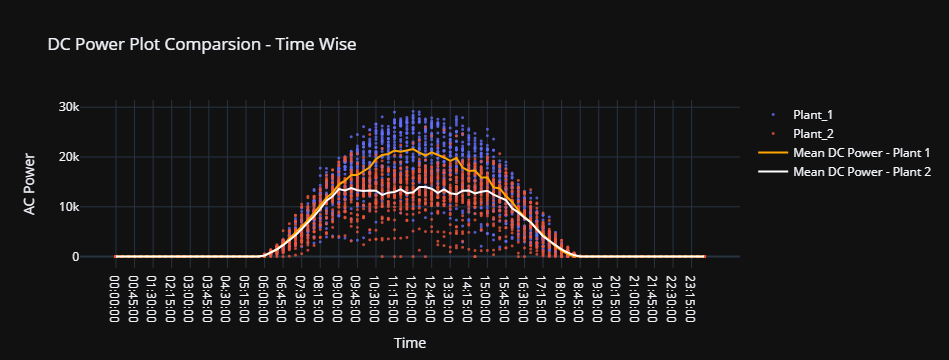

In [18]:
ac_mean_p1 = plant1_data.groupby('time')['AC_POWER'].agg('mean').reset_index()
ac_mean_p2 = plant2_data.groupby('time')['AC_POWER'].agg('mean').reset_index()

fig = go.Figure()

fig.add_trace(go.Scatter(x=plant1_data["time"], y=plant1_data["AC_POWER"], name='Plant_1', mode="markers",
                         ))

fig.add_trace(go.Scatter(
    x=plant2_data["time"], y=plant2_data["AC_POWER"], name='Plant_2', mode="markers"))

fig.add_scatter(x=ac_mean_p1["time"], y= ac_mean_p1["AC_POWER"],name='Mean DC Power - Plant 1',line=dict(color="orange"))

fig.add_scatter(x=ac_mean_p2["time"], y= ac_mean_p2["AC_POWER"],name='Mean DC Power - Plant 2',line=dict(color="white"))

fig.update_traces(marker=dict(size=3, opacity=0.8), selector=dict(mode='markers'))

fig.update_layout(title="DC Power Plot Comparsion - Time Wise",
                 xaxis_title="Time",
                 yaxis_title="AC Power",template="plotly_dark")



fig.show()

<div class="alert alert-success" role="alert">

The two plants are almost the same ac power.

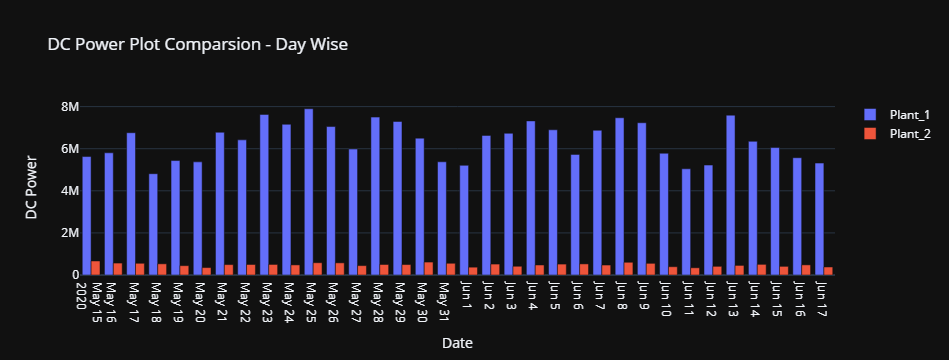

In [19]:
p1_daily_dc = plant1_data.groupby('date')['DC_POWER'].agg('sum').reset_index()
p2_daily_dc = plant2_data.groupby('date')['DC_POWER'].agg('sum').reset_index()

fig = go.Figure()

fig.add_trace(go.Bar(x=p1_daily_dc["date"], y=p1_daily_dc["DC_POWER"], name='Plant_1'
                         ))

fig.add_trace(go.Bar(x=p2_daily_dc["date"], y=p2_daily_dc["DC_POWER"], name='Plant_2'
                         ))


fig.update_traces(marker=dict(size=3, opacity=0.8), selector=dict(mode='markers'))

fig.update_layout(title="DC Power Plot Comparsion - Day Wise ",
                 xaxis_title="Date",
                 yaxis_title="DC Power",template="plotly_dark")
fig.update_xaxes(
    dtick="d1",
    )


fig.show()

<div class="alert alert-success" role="alert">


Each date plant1 is huge to produce a dc power but plant 2 reach almost 1 GW.

In [20]:
p1_daily_ac = plant1_data.groupby('date')['AC_POWER'].agg('sum').reset_index()
p2_daily_ac = plant2_data.groupby('date')['AC_POWER'].agg('sum').reset_index()

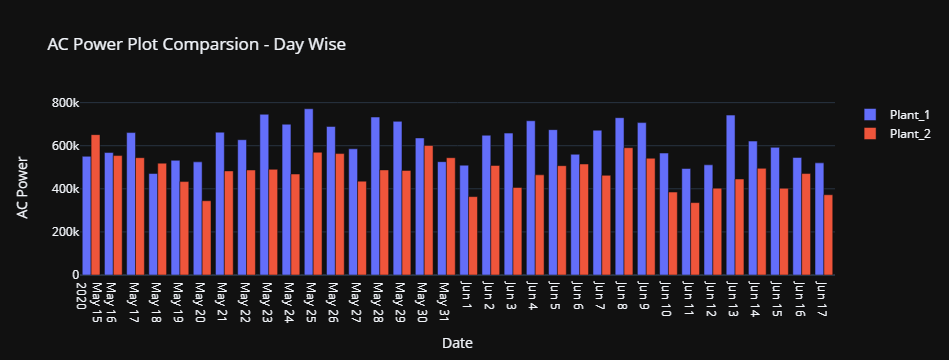

In [21]:
fig = go.Figure()

fig.add_trace(go.Bar(x=p1_daily_ac["date"], y=p1_daily_ac["AC_POWER"], name='Plant_1'
                         ))

fig.add_trace(go.Bar(x=p2_daily_ac["date"], y=p2_daily_ac["AC_POWER"], name='Plant_2'
                         ))


fig.update_traces(marker=dict(size=3, opacity=0.8), selector=dict(mode='markers'))

fig.update_layout(title="AC Power Plot Comparsion - Day Wise ",
                 xaxis_title="Date",
                 yaxis_title="AC Power",template="plotly_dark")
fig.update_xaxes(
    dtick="d1",
    )


fig.show()

<div class="alert alert-success" role="alert">


Plant I and Plant II are almost same to produce a ac power for each day.

In [22]:
#compute daily_yield for each date
p1_dyield = plant1_data.groupby('date')['DAILY_YIELD'].agg('sum').reset_index()
p2_dyield = plant2_data.groupby('date')['DAILY_YIELD'].agg('sum').reset_index()

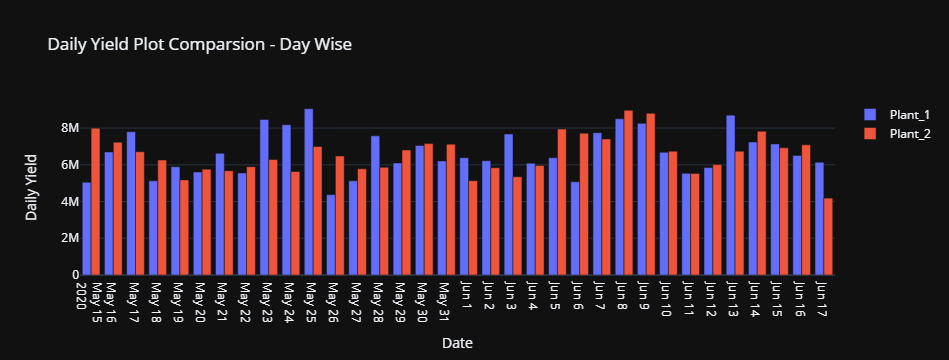

In [23]:
fig = go.Figure()

fig.add_trace(go.Bar(x=p1_dyield["date"], y=p1_dyield['DAILY_YIELD'], name='Plant_1'
                         ))

fig.add_trace(go.Bar(x=p2_dyield["date"], y=p2_dyield['DAILY_YIELD'], name='Plant_2'
                         ))


fig.update_traces(marker=dict(size=3, opacity=0.8), selector=dict(mode='markers'))

fig.update_layout(title="Daily Yield Plot Comparsion - Day Wise ",
                 xaxis_title="Date",
                 yaxis_title="Daily Yield",template="plotly_dark")
fig.update_xaxes(
    dtick="d1",
    )


fig.show()

<div class="alert alert-success" role="alert">


Plant I and plant II have almost same daily yield but certain days, they are differents

In [24]:
#compute a average total_yield for plant I for each day
p1_tyield = plant1_data.groupby('date')['TOTAL_YIELD'].agg('mean').reset_index()

#compute a average total_yield for plant II for each day
p2_tyield = plant2_data.groupby('date')['TOTAL_YIELD'].agg('mean').reset_index()

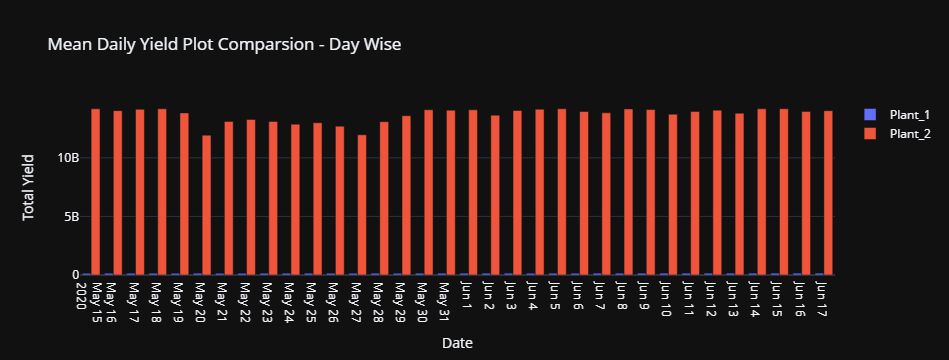

In [25]:
fig = go.Figure()

fig.add_trace(go.Bar(x=p1_tyield["date"], y=p1_tyield['TOTAL_YIELD'], name='Plant_1'
                         ))

fig.add_trace(go.Bar(x=p2_tyield["date"], y=p2_tyield['TOTAL_YIELD'], name='Plant_2'
                         ))


fig.update_traces(marker=dict(size=3, opacity=0.8), selector=dict(mode='markers'))

fig.update_layout(title="Mean Daily Yield Plot Comparsion - Day Wise ",
                 xaxis_title="Date",
                 yaxis_title="Total Yield",template="plotly_dark")
fig.update_xaxes(
    dtick="d1",
    )


fig.show()

<div class="alert alert-success" role="alert">

The gap between average total yield for plant II and average total yield for plant I for each date is very large. 

## Plant I weather sensor vs Plant II weather sensor

In [26]:
file1 = 'Plant_1_Weather_Sensor_Data.csv'

In [27]:
plant1_sensor = pd.read_csv(file1)

In [28]:
plant1_sensor.head()

,DATE_TIME,PLANT_ID,SOURCE_KEY,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,4135001,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0
1,2020-05-15 00:15:00,4135001,HmiyD2TTLFNqkNe,25.084589,22.761668,0.0
2,2020-05-15 00:30:00,4135001,HmiyD2TTLFNqkNe,24.935753,22.592306,0.0
3,2020-05-15 00:45:00,4135001,HmiyD2TTLFNqkNe,24.846130,22.360852,0.0
4,2020-05-15 01:00:00,4135001,HmiyD2TTLFNqkNe,24.621525,22.165423,0.0


In [29]:
plant1_sensor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3182 entries, 0 to 3181
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   DATE_TIME            3182 non-null   object 
 1   PLANT_ID             3182 non-null   int64  
 2   SOURCE_KEY           3182 non-null   object 
 3   AMBIENT_TEMPERATURE  3182 non-null   float64
 4   MODULE_TEMPERATURE   3182 non-null   float64
 5   IRRADIATION          3182 non-null   float64
dtypes: float64(3), int64(1), object(2)
memory usage: 149.3+ KB


In [30]:
plant1_sensor['DATE_TIME'] = pd.to_datetime(plant1_sensor['DATE_TIME'], errors='coerce')

In [31]:
# same work cleaning data
plant1_sensor['date'] = pd.to_datetime(pd.to_datetime(plant1_sensor['DATE_TIME']).dt.date)
plant1_sensor['time'] = pd.to_datetime(plant1_sensor['DATE_TIME']).dt.time


del plant1_sensor['PLANT_ID']
del plant1_sensor['SOURCE_KEY']

In [32]:
plant1_sensor.tail()

,DATE_TIME,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,date,time
3177,2020-06-17 22:45:00,22.150570,21.480377,0.0,2020-06-17,22:45:00
3178,2020-06-17 23:00:00,22.129816,21.389024,0.0,2020-06-17,23:00:00
3179,2020-06-17 23:15:00,22.008275,20.709211,0.0,2020-06-17,23:15:00
3180,2020-06-17 23:30:00,21.969495,20.734963,0.0,2020-06-17,23:30:00
3181,2020-06-17 23:45:00,21.909288,20.427972,0.0,2020-06-17,23:45:00


In [33]:
file3 = 'Plant_2_Weather_Sensor_Data.csv'

In [34]:
plant2_sensor = pd.read_csv(file3)

In [35]:
plant2_sensor.tail()

,DATE_TIME,PLANT_ID,SOURCE_KEY,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
3254,2020-06-17 22:45:00,4136001,iq8k7ZNt4Mwm3w0,23.511703,22.856201,0.0
3255,2020-06-17 23:00:00,4136001,iq8k7ZNt4Mwm3w0,23.482282,22.744190,0.0
3256,2020-06-17 23:15:00,4136001,iq8k7ZNt4Mwm3w0,23.354743,22.492245,0.0
3257,2020-06-17 23:30:00,4136001,iq8k7ZNt4Mwm3w0,23.291048,22.373909,0.0
3258,2020-06-17 23:45:00,4136001,iq8k7ZNt4Mwm3w0,23.202871,22.535908,0.0


In [36]:
plant2_sensor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3259 entries, 0 to 3258
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   DATE_TIME            3259 non-null   object 
 1   PLANT_ID             3259 non-null   int64  
 2   SOURCE_KEY           3259 non-null   object 
 3   AMBIENT_TEMPERATURE  3259 non-null   float64
 4   MODULE_TEMPERATURE   3259 non-null   float64
 5   IRRADIATION          3259 non-null   float64
dtypes: float64(3), int64(1), object(2)
memory usage: 152.9+ KB


In [37]:
plant2_sensor['DATE_TIME'] = pd.to_datetime(plant2_sensor['DATE_TIME'], errors='coerce')

In [38]:
# same work cleaning data for plant II
plant2_sensor['date'] = pd.to_datetime(pd.to_datetime(plant2_sensor['DATE_TIME']).dt.date)
plant2_sensor['time'] = pd.to_datetime(plant2_sensor['DATE_TIME']).dt.time


del plant2_sensor['PLANT_ID']
del plant2_sensor['SOURCE_KEY']

In [39]:
plant2_sensor.head()

,DATE_TIME,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,date,time
0,2020-05-15 00:00:00,27.004764,25.060789,0.0,2020-05-15,00:00:00
1,2020-05-15 00:15:00,26.880811,24.421869,0.0,2020-05-15,00:15:00
2,2020-05-15 00:30:00,26.682055,24.427290,0.0,2020-05-15,00:30:00
3,2020-05-15 00:45:00,26.500589,24.420678,0.0,2020-05-15,00:45:00
4,2020-05-15 01:00:00,26.596148,25.088210,0.0,2020-05-15,01:00:00


In [40]:
pd.set_option('display.precision', 2)


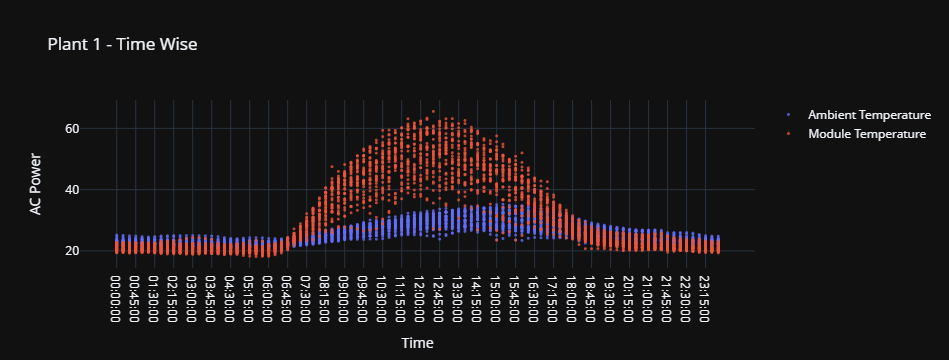

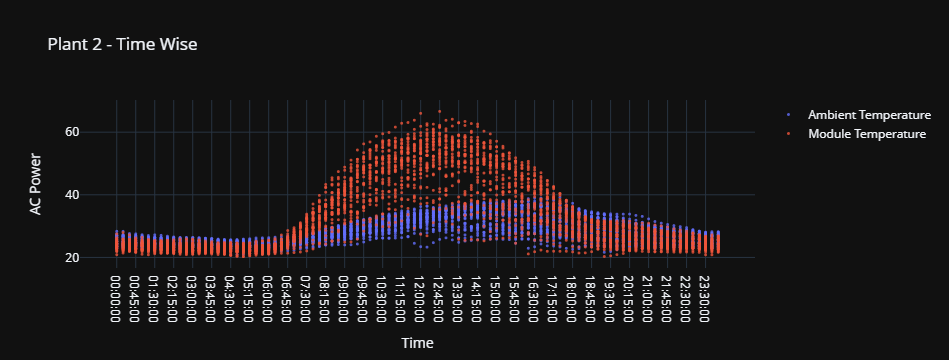

In [41]:
p1_t = plant1_sensor[['AMBIENT_TEMPERATURE',
                      'MODULE_TEMPERATURE', 'time', 'date']]
p2_t = plant2_sensor[['AMBIENT_TEMPERATURE',
                      'MODULE_TEMPERATURE', 'time', 'date']]


fig1 = go.Figure()

fig1.add_trace(go.Scatter(x=p1_t["time"], y=p1_t["AMBIENT_TEMPERATURE"],
               text=p1_t['date'].dt.date, name='Ambient Temperature',mode="markers"))

fig1.add_trace(go.Scatter(x=p1_t["time"], y=p1_t["MODULE_TEMPERATURE"],
               text=p1_t['date'].dt.date, name='Module Temperature', mode="markers"))


fig1.update_traces(marker=dict(size=3, opacity=0.8),
                   selector=dict(mode='markers'))

fig1.update_layout(title="Plant 1 - Time Wise",
                   xaxis_title="Time",
                   yaxis_title="AC Power", template="plotly_dark", hovermode="x unified")


fig2 = go.Figure()

fig2.add_trace(go.Scatter(x=p2_t["time"], y=p2_t["AMBIENT_TEMPERATURE"],
               text=p2_t['date'].dt.date, name='Ambient Temperature', mode="markers"))

fig2.add_trace(go.Scatter(x=p2_t["time"], y=p2_t["MODULE_TEMPERATURE"],
               text=p2_t['date'].dt.date, name='Module Temperature', mode="markers"))


fig2.update_traces(marker=dict(size=3, opacity=0.8),
                   selector=dict(mode='markers'))

fig2.update_layout(title="Plant 2 - Time Wise",
                   xaxis_title="Time",
                   yaxis_title="AC Power", template="plotly_dark", hovermode="x unified")


fig1.show()
fig2.show()

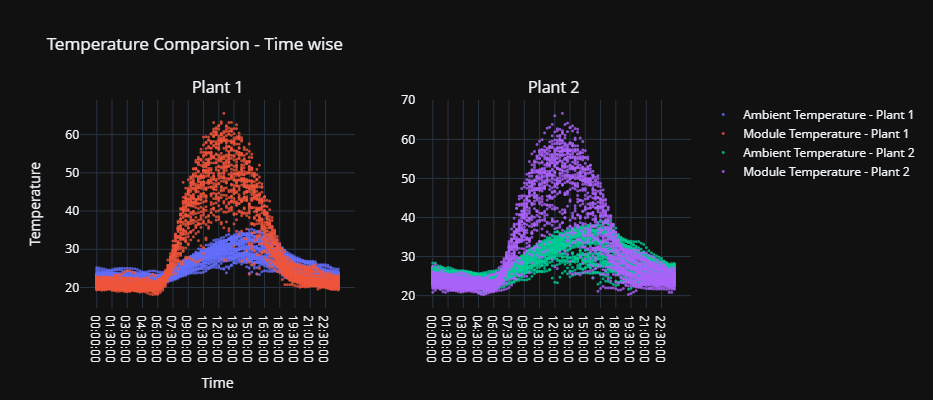

In [42]:
fig_1a = fig1.data[0]
fig_1b = fig1.data[1]
fig_2a = fig2.data[0]
fig_2b = fig2.data[1]

fig = make_subplots(rows=1, cols=2,column_widths=[1, 1],
                                 row_heights=[0.4],subplot_titles=('Plant 1',
                                    'Plant 2'))
fig.add_trace(fig_1a,row=1, col=1)
fig.add_trace(fig_1b,row=1, col=1)

fig.add_trace(fig_2a,row=1, col=2)
fig.add_trace(fig_2b,row=1, col=2)

fig.update_traces(marker=dict(size=3, opacity=0.8), selector=dict(mode='markers'))

fig.update_layout(title="Temperature Comparsion - Time wise",
                 xaxis_title="Time",
                 yaxis_title="Temperature",template="plotly_dark",
                 width=1000,
                 height=400, hovermode="x unified")



fig['data'][0]['name']= 'Ambient Temperature - Plant 1'
fig['data'][1]['name']= 'Module Temperature - Plant 1'
fig['data'][2]['name']= 'Ambient Temperature - Plant 2'
fig['data'][3]['name']= 'Module Temperature - Plant 2'

fig.layout.annotations[0]['name']= "Plant 1"
#fig.layout.annotations[1].update(text="P")

fig.show()

<div class="alert alert-info" role="alert">
<p style = "font-family:poppins;font-size:16px;font-style:bold;color:black;"> 
Ambient temperatures range from 20 to 35°C, modules reach temperatures from 18 to 65 °C. Modules reach significantly higher temperatures than their ambient air during daytime. Ambient temperature is lagging behind daily module cooldown. This means the modules cool down quicker than their environment.

<div class="alert alert-info" role="alert">
<p style = "font-family:poppins;font-size:16px;font-style:bold;color:black;"> 
Ambient temperatures range from 20 to 35°C, modules reach temperatures from 18 to 65 °C. Modules reach significantly higher temperatures than their ambient air during daytime. Ambient temperature is lagging behind daily module cooldown. This means the modules cool down quicker than their environment.

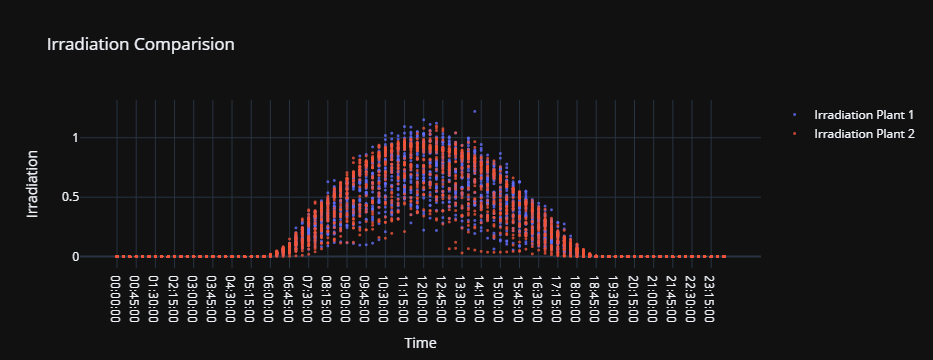

In [43]:
#compare IRRADIATION PLANT I VS PLANT II
fig1 = go.Figure()

fig1.add_trace(go.Scatter(x=plant1_sensor["time"], y=plant1_sensor["IRRADIATION"],
               text=plant1_sensor['date'].dt.date, name='Irradiation Plant 1',mode="markers"))

fig1.add_trace(go.Scatter(x=plant2_sensor["time"], y=plant2_sensor["IRRADIATION"],
               text=plant2_sensor['date'].dt.date, name='Irradiation Plant 2', mode="markers"))


fig1.update_traces(marker=dict(size=3, opacity=0.8),
                   selector=dict(mode='markers'))

fig1.update_layout(title="Irradiation Comparision",
                   xaxis_title="Time",
                   yaxis_title="Irradiation", template="plotly_dark", hovermode="x unified")


<div class="alert alert-info" role="alert">
<p style = "font-family:poppins;font-size:16px;font-style:bold;color:black;"> 
Plant I and Plant II have same  IRRADIATION  distribution between 05:33:20 and 18:00:00.

<div class="alert alert-success" role="alert">

**General Conclusion**

throughout this notebook, we can say that
1. plant I produces 6 times more DC power than plant II. And loses 90% of it when converting to AC power.
2. While Plant II loses nothing when converting DC power to AC power.

3. AC power output is almost the same for both plants.

4. The daily yield is almost the same for the two plants.

5. The gap between The average total yield for plant I and plant II is very large. 

6. Daily yield decrease if delta temperature is less than 5°C.

7. Daily yield decrease for some value of AC power.

END.
